# Drive

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')
root_dir = "/content/gdrive/My Drive/"

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


# Libs

In [3]:
!pip install deep-translator

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.4 MB/s eta 0:00:00


In [4]:
!pip install salesforce-lavis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 33.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 24.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 MB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

In [5]:
import pandas as pd
import numpy as np
from PIL import Image
import requests
from tqdm import tqdm
import torch
import torch.nn.functional as F
from pkg_resources import packaging
from glob import glob
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
sns.set_theme("notebook", font_scale=1.3)
import os
import json
from deep_translator import GoogleTranslator
from scipy import spatial

from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
import numpy as np, matplotlib, matplotlib.pyplot as plt, seaborn as sns

# Unzip folder

In [6]:
!unzip /content/pietanze.zip

Archive:  /content/pietanze.zip
   creating: pietanze/
  inflating: pietanze/mappa.json     
  inflating: pietanze/.DS_Store      
   creating: pietanze/dolce/
  inflating: pietanze/dolce/bigne_1.jpg  
  inflating: pietanze/dolce/.DS_Store  
  inflating: pietanze/dolce/tiramisu_2.jpeg  
  inflating: pietanze/dolce/bigne_2.jpg  
  inflating: pietanze/dolce/bigne_3.jpg  
  inflating: pietanze/dolce/baba_1.jpeg  
  inflating: pietanze/dolce/crostata_1.jpg  
  inflating: pietanze/dolce/crostata_3.jpg  
  inflating: pietanze/dolce/crostata_2.jpg  
  inflating: pietanze/dolce/baba_2.jpg  
  inflating: pietanze/dolce/baba_3.jpg  
  inflating: pietanze/dolce/panna_cotta_1.jpeg  
  inflating: pietanze/dolce/panna_cotta_2.jpg  
  inflating: pietanze/dolce/panna_cotta_3.jpg  
  inflating: pietanze/dolce/tiramisu_1.jpg  
  inflating: pietanze/dolce/tiramisu_3.jpg  
  inflating: pietanze/dolce/millefoglie_1.jpg  
  inflating: pietanze/dolce/millefoglie_2.jpg  
  inflating: pietanze/dolce/millefogli

In [7]:
import json
image_map = None
with open('/content/pietanze/mappa.json', 'r') as f:
    image_map = json.load(f)

# Functions

In [8]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))

Using device: cuda

Tesla T4


In [9]:
def translate_caption(string):
    try:
        #print('ita_string: ', string)
        string_translated = GoogleTranslator(source='auto', target='en').translate(string)
        #print('string_translated: ', string_translated)
        return string_translated
    except Exception as e:
        string_translated = ''
        print("Errore per ita_string '{}' - caption '{}' - errore: {}".format(string))
        return string_translated

In [10]:
def transform_image(image, image_size):

    transform = transforms.Compose([
        transforms.Resize((image_size,image_size),interpolation=InterpolationMode.BICUBIC),
        transforms.ToTensor(),
        transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
        ])
    image = transform(image)
    return image

# Load images and texts

Read the map with the path to the images and their corresponding descriptions. Put the images and the descriptions in the lists "images" and "texts". Show images, description and name in a figure

In [11]:
principal_dir = "/content/pietanze"

images = []
texts = []
names_image = []
original_texts = []
#plt.figure(figsize=(300, 300)) # Width, height

# iter over the dishes
for _, dishes, _ in os.walk(principal_dir):
    for dish in dishes:
        path_dish = os.path.join(principal_dir, dish)
        CHECK_FOLDER = os.path.isdir(path_dish)
        if CHECK_FOLDER:
            #print("DISH: ", dish)
            #print("PATH DISH: ", path_dish)

            images_list = os.listdir(path_dish)
            #print("images_list: ", images_list)
            for name_image in images_list:
                if name_image != ".DS_Store" and name_image != ".ipynb_checkpoints":
                    path_image = os.path.join(path_dish, name_image)
                    chiave = ("/").join(path_image.split("/")[2:])
                    image = Image.open(path_image).convert("RGB")
                    origninal_text = image_map[chiave]
                    text = translate_caption(origninal_text)

                    #plt.subplot(len(image_map), 1, len(images) + 1)
                    #plt.imshow(image)
                    #plt.title(f"{name_image}\n{text}")
                    #plt.xticks([])
                    #plt.yticks([])

                    images.append(image)
                    texts.append(text)
                    names_image.append(name_image)
                    original_texts.append(origninal_text)

            #print("----------------------------------")

#plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/list_images_descriptions.png")
#plt.tight_layout()

# Apply BLIP from LAVIS lib - images, text and multimodal embedding

In order to use the image-text retrieval model finetuned on COCO I have to use the source code from the project page https://github.com/salesforce/BLIP

In the latest version of colab the BLIP project works if we have installed the LAVIS package

In this example we use the finetuned model with ViT base https://storage.googleapis.com/sfr-vision-language-research/BLIP/models/model_base_retrieval_coco.pth


In [12]:
# install requirements
import sys
if 'google.colab' in sys.modules:
    print('Running in Colab.')
    !pip3 install transformers==4.15.0 timm==0.4.12 fairscale==0.4.4
    !git clone https://github.com/salesforce/BLIP
    %cd BLIP

Running in Colab.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 880.6/880.6 kB 17.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.7/212.7 kB 20.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  error: subprocess-exited-with-error
  
  × Building wheel for tokenizers (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for tokenizers
  Created wheel for sacremoses: filename=sacremoses-0.0.53-py3-none-any.whl size=895241 sha256=db3e2d2f6edf1bafe54bc80605efa940d8782d79820928d5c9a9694408c2cd12
  Stored in directory: /root/.cache/pip/wheels/00/24/97/a2ea5324f36bc626e1ea0267f33db6aa80d157ee977e9e42fb

Download and set the model

In [13]:
from models.blip import blip_feature_extractor
image_size = 224
model_url = 'https://storage.googleapis.com/sfr-vision-language-research/BLIP/models/model_base_retrieval_coco.pth'
model = blip_feature_extractor(pretrained=model_url, image_size=image_size, vit='base')
model.eval()
model = model.to(device)

100%|██████████| 1.78G/1.78G [00:22<00:00, 84.3MB/s]


reshape position embedding from 576 to 196
load checkpoint from https://storage.googleapis.com/sfr-vision-language-research/BLIP/models/model_base_retrieval_coco.pth


## Extraction of the embeddings

In [14]:
images_embedding = None
texts_embedding = None
multimodal_embedding = None

# iter over the list of text and images

for text, image in zip(texts,images):


    with torch.no_grad():

        text_translated = translate_caption(text)
        transformed_image = transform_image(image, image_size).unsqueeze(0).to(device)
        multimodal_emb = model(transformed_image, text_translated, mode='multimodal')[:,0]
        image_emb = model(transformed_image, text_translated, mode='image')[:,0]
        text_emb = model(transformed_image, text_translated, mode='text')[:,0]

    # stack tensor
    if images_embedding is None:
        images_embedding = image_emb
    else:
       images_embedding = torch.cat((images_embedding, image_emb),0)

    if texts_embedding is None:
        texts_embedding = text_emb
    else:
       texts_embedding = torch.cat((texts_embedding, text_emb),0)

    if multimodal_embedding is None:
        multimodal_embedding = multimodal_emb
    else:
       multimodal_embedding = torch.cat((multimodal_embedding, multimodal_emb),0)

print('images_embedding.size(): ', images_embedding.size())
print('texts_embedding.size(): ', texts_embedding.size())
print('multimodal_embedding.size(): ', multimodal_embedding.size())
'''
images_embedding.size():  torch.Size([69, 768])
texts_embedding.size():  torch.Size([69, 768])
multimodal_embedding.size():  torch.Size([69, 768])
'''

images_embedding.size():  torch.Size([68, 768])
texts_embedding.size():  torch.Size([68, 768])
multimodal_embedding.size():  torch.Size([68, 768])


'\nimages_embedding.size():  torch.Size([69, 768])\ntexts_embedding.size():  torch.Size([69, 768])\nmultimodal_embedding.size():  torch.Size([69, 768])\n'

## Normalization

Divide each tensors by its norm. In this way when i calculate the dot product between two tensors i directly obtain the cosin between the two

In [15]:
images_embedding /= images_embedding.norm(dim=-1, keepdim=True)
texts_embedding /= texts_embedding.norm(dim=-1, keepdim=True)
multimodal_embedding /= multimodal_embedding.norm(dim=-1, keepdim=True)

## Similarity matrices

In [16]:
## image vs image
similarity_images = images_embedding.cpu().detach().numpy() @ images_embedding.cpu().detach().numpy().T
similarity_images_texts = images_embedding.cpu().detach().numpy() @ texts_embedding.cpu().detach().numpy().T
similarity_multimodal = multimodal_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T
similarity_images_multimodal = images_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T

function to plot the similarity matrixfor the plot i use
https://stackoverflow.com/questions/67310634/how-to-plot-image-image-similarity-matrix-map

In [17]:
def ImgLabels(N, ax):

    def offset_image(coord, image_plot, ax):

        im = matplotlib.offsetbox.OffsetImage(image_plot, zoom = 1)
        im.image.axes = ax

        for co, xyb in [((0, coord), (-30, -30)),    ((coord, N), (+30, -30))]: # these number have to be adjusted if change the image dimension as well as the number of examples
            ab = matplotlib.offsetbox.AnnotationBbox(im, co,  xybox = xyb,
                frameon=False, xycoords='data',  boxcoords="offset points", pad=0)
            ax.add_artist(ab)

    for i, img in enumerate(images):
        image_resized = img.resize((55, 55))
        offset_image(i, image_resized, ax)

def HeatMap(N, corr):
    sns.set_theme(style = "white")
    mask = np.triu(np.ones_like(corr, dtype = bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
                square=True, annot = True, xticklabels = False, yticklabels = False)


def plot_similarity_matrix(matrix, dimension, name_fig):
    f, ax = plt.subplots(figsize=(100, 100))
    HeatMap(dimension, matrix)
    ImgLabels(dimension, ax)
    plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/similarity_matrices/"+name_fig+".png")
    plt.show()

### Image-image similarity

In [18]:
name_fig = "images_blip_finetuned_coco"
plot_similarity_matrix(similarity_images, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Image-text similarity

In [19]:
name_fig = "images_texts_blip_finetuned_coco"
plot_similarity_matrix(similarity_images_texts, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Multimodal-multimodal similarity

In [20]:
name_fig = "multimodal_blip_finetuned_coco"
plot_similarity_matrix(similarity_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Images-multimodal similarity

In [21]:
name_fig = "images_multimodal_finetuned_coco"
plot_similarity_matrix(similarity_images_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

## Search function

search_modality: (II for image vs image - TI for text vs image - MI for multimodal vs image -  IT for image vs text - TT for text vs text - MT for multimodal vs text - IM for image vs multimodal - TM for text vs multimodal - MM for multimodal vs multimodal). The first argument refers to the target product the second for the database product

In [25]:
def search_similar_product(image_target, text_target, number_retrieval, search_modality, len_dataset = 68, is_coco_finetuned = False):

    retrieval_map = {}

    # preprocess image. check if the image is None. In this case build a tensor with shape (1, 3, 224, 224)
    if image_target is None:
        if is_coco_finetuned:
            image_processed = torch.rand(1, 3, 364, 364).to(device)
        else:
            image_processed = torch.rand(1, 3, 224, 224).to(device)
    else:
      image_processed = transform_image(image, image_size).unsqueeze(0).to(device)


    # translate the text
    text_input = translate_caption(text_target)

    # find features of image and text target
    with torch.no_grad():
        multimodal_emb = model(image_processed, text_input, mode='multimodal')[0,0] # size (768)
        image_emb = model(image_processed, text_input, mode='image')[0,0] # size (768)
        text_emb = model(image_processed, text_input, mode='text')[0,0] # size (768)

    # normalize
    image_emb /= image_emb.norm(dim=-1, keepdim=True)
    text_emb /= text_emb.norm(dim=-1, keepdim=True)
    multimodal_emb /= multimodal_emb.norm(dim=-1, keepdim=True)

    # transform to numpy tensor
    image_emb = image_emb.cpu().detach().numpy()
    text_emb = text_emb.cpu().detach().numpy()
    multimodal_emb = multimodal_emb.cpu().detach().numpy()

    if search_modality == "II":
      similarity_vector = images_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ multimodal_emb.T

    index_sorted = np.argsort(similarity_vector)

    for i in range(1, number_retrieval+1):

        print("Extracted: ", i)

        # index of the db product
        idx = index_sorted[len_dataset-i]
        similarity_value = similarity_vector[idx]

        print("idx: ", idx)
        print("similarity value: ", similarity_value)

        # extract name of the image
        name_image_found = names_image[idx]
        print("name_image_found: ", name_image_found)
        print("-----------------------")

        # extract text of the image
        text_image_found = original_texts[idx]
        translated_text_image_found = texts[idx]

        # extract image
        image_found = images[idx]

        #fill the extracted infos in the map
        retrieval_map[i] = (image_found, name_image_found, text_image_found, translated_text_image_found, similarity_value)

    return retrieval_map

### Test 1

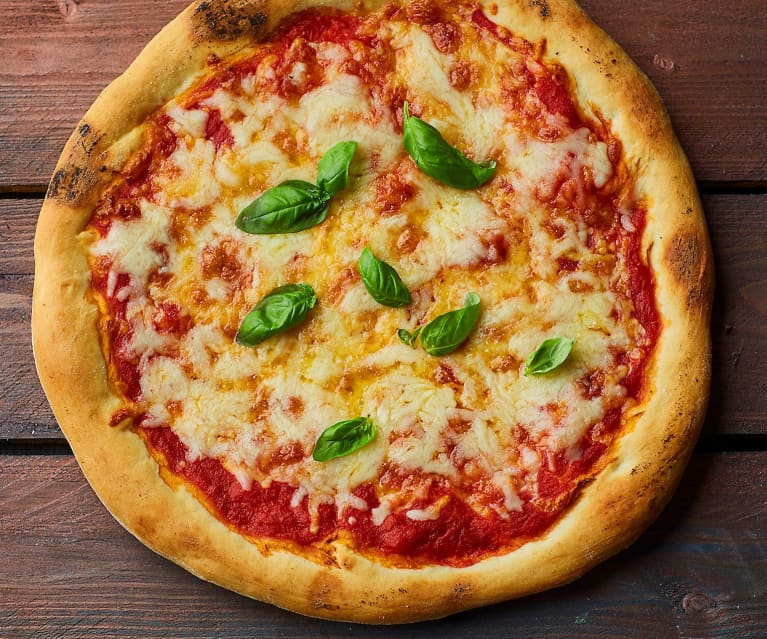

In [23]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pizza_marghetita_test.jpg"
text_image_target = ""
number_retrieval = 3
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  67
similarity value:  1.0
name_image_found:  carbonara_3.jpeg
-----------------------
Extracted:  2
idx:  64
similarity value:  0.78964627
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  3
idx:  59
similarity value:  0.7888948
name_image_found:  carbonara_1.jpg
-----------------------


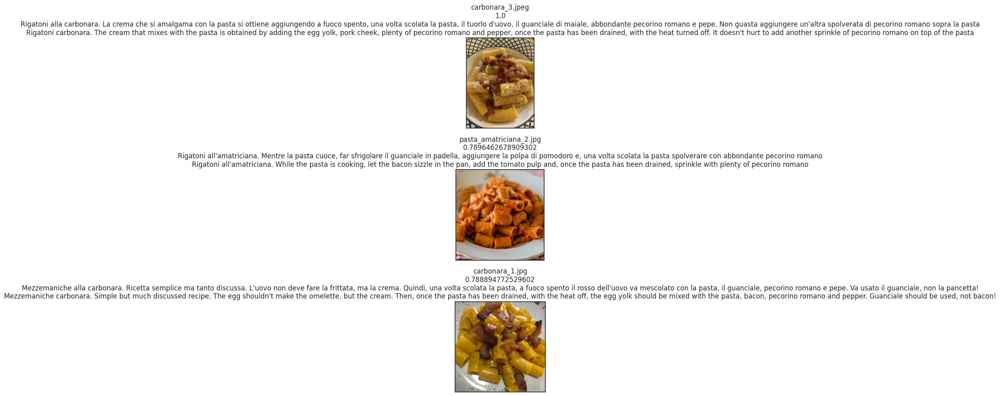

In [26]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 2

In [27]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/bistecca_fiorentina_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  59
similarity value:  1.0
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  2
idx:  67
similarity value:  0.7888947
name_image_found:  carbonara_3.jpeg
-----------------------
Extracted:  3
idx:  64
similarity value:  0.7131871
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  4
idx:  38
similarity value:  0.64378214
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  5
idx:  62
similarity value:  0.62948394
name_image_found:  pasta_pomodoro_2.jpg
-----------------------


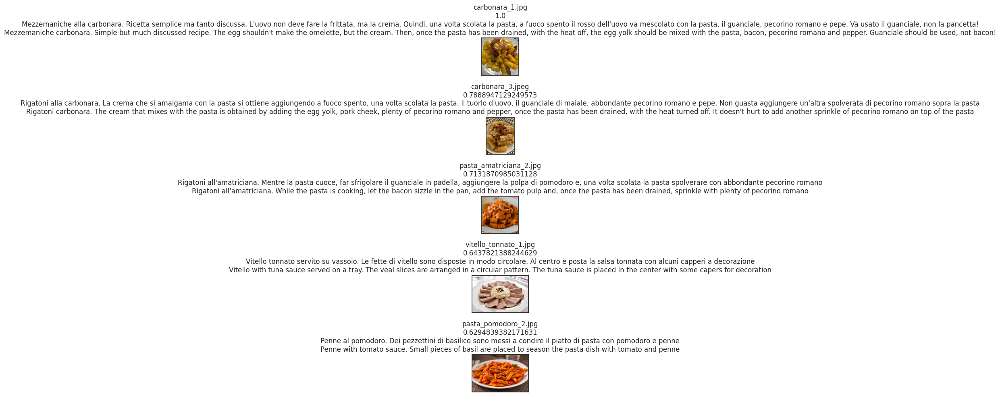

In [28]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 3


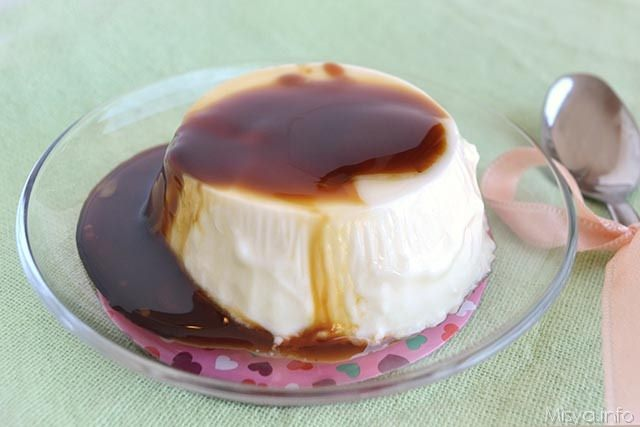

In [29]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panna_cotta_caramello_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  62
similarity value:  1.0
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  2
idx:  64
similarity value:  0.77204865
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  3
idx:  66
similarity value:  0.758425
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  54
similarity value:  0.68905324
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  5
idx:  57
similarity value:  0.68882716
name_image_found:  pasta_amatriciana_3.jpg
-----------------------


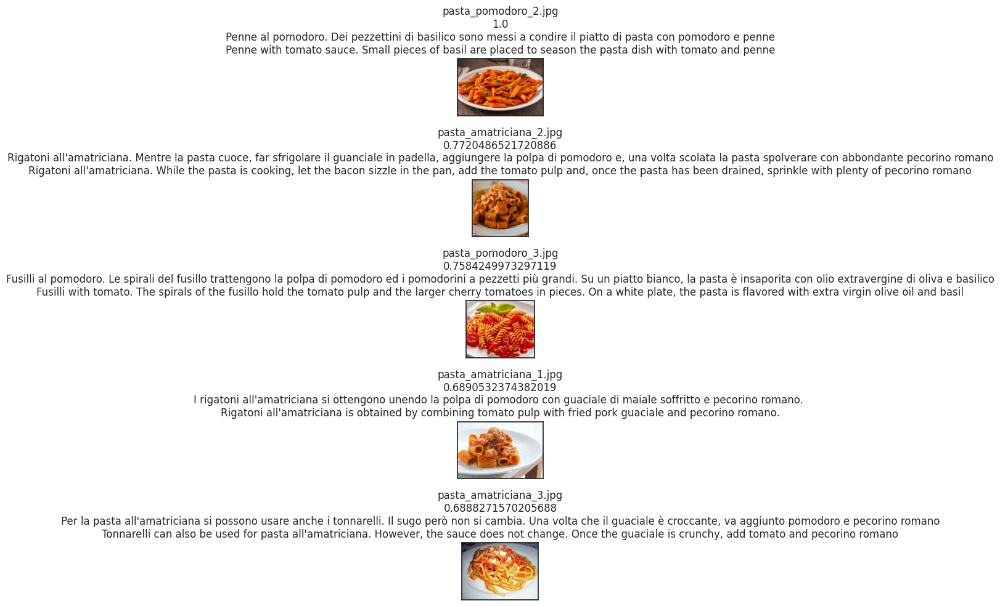

In [30]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 4

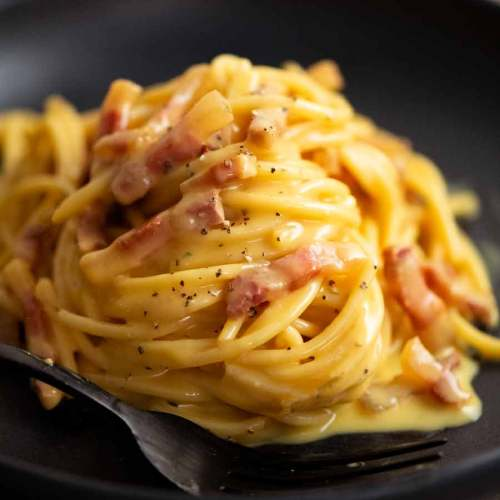

In [31]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_carbonara_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  57
similarity value:  1.0
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  2
idx:  58
similarity value:  0.7834262
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  3
idx:  60
similarity value:  0.7611495
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  4
idx:  66
similarity value:  0.75084496
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  5
idx:  54
similarity value:  0.74920046
name_image_found:  pasta_amatriciana_1.jpg
-----------------------


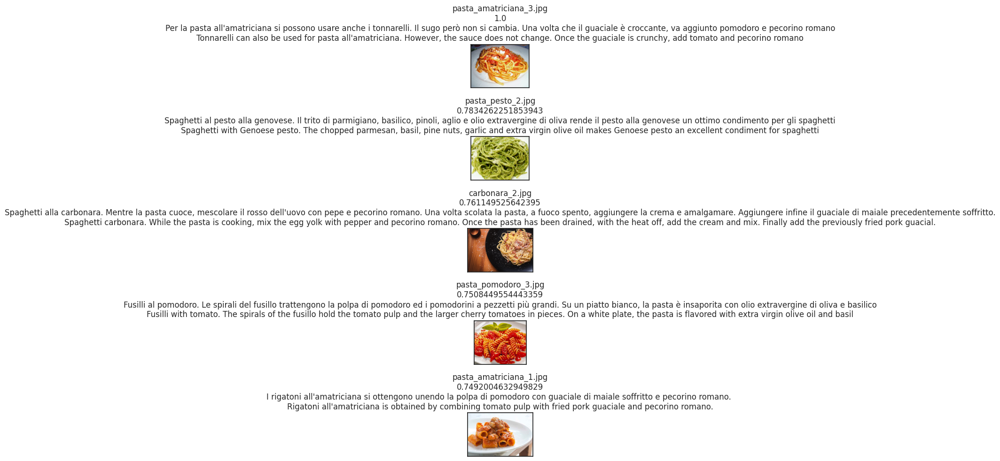

In [32]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 5

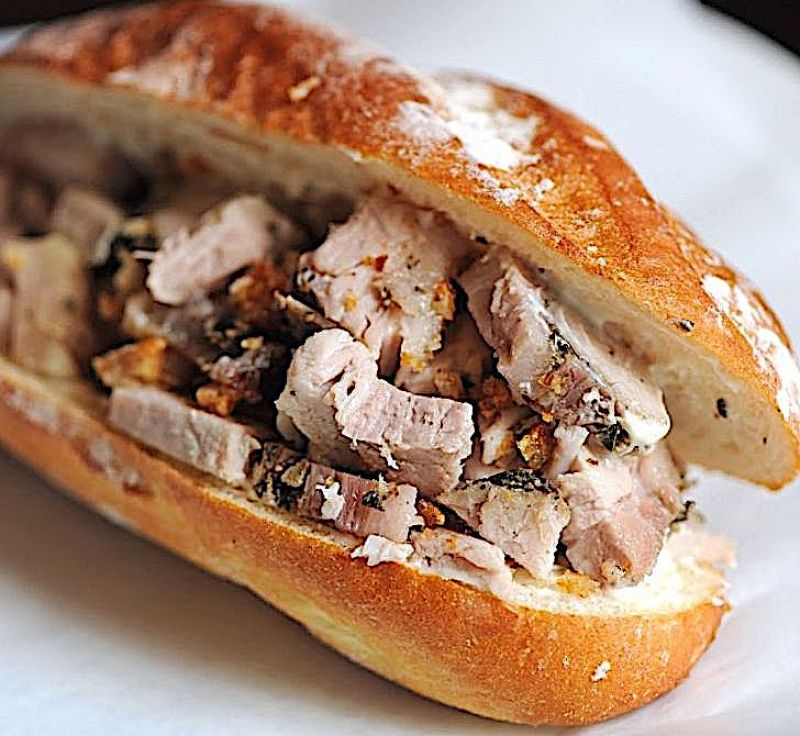

In [33]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panino_porchetta_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  54
similarity value:  1.0
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  2
idx:  64
similarity value:  0.77957547
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  3
idx:  57
similarity value:  0.74920046
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  4
idx:  65
similarity value:  0.7336074
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  5
idx:  66
similarity value:  0.708187
name_image_found:  pasta_pomodoro_3.jpg
-----------------------


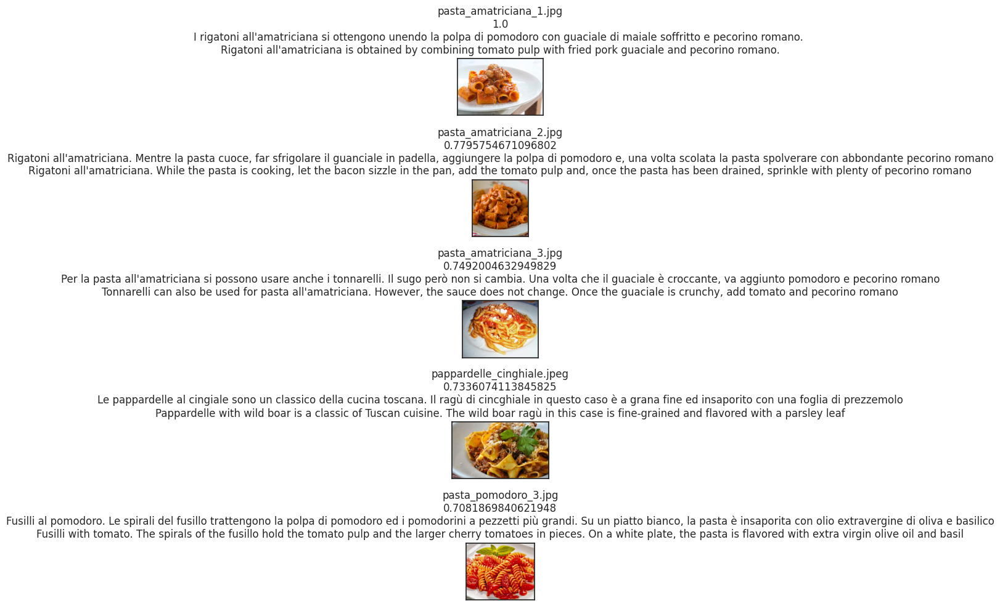

In [34]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 6

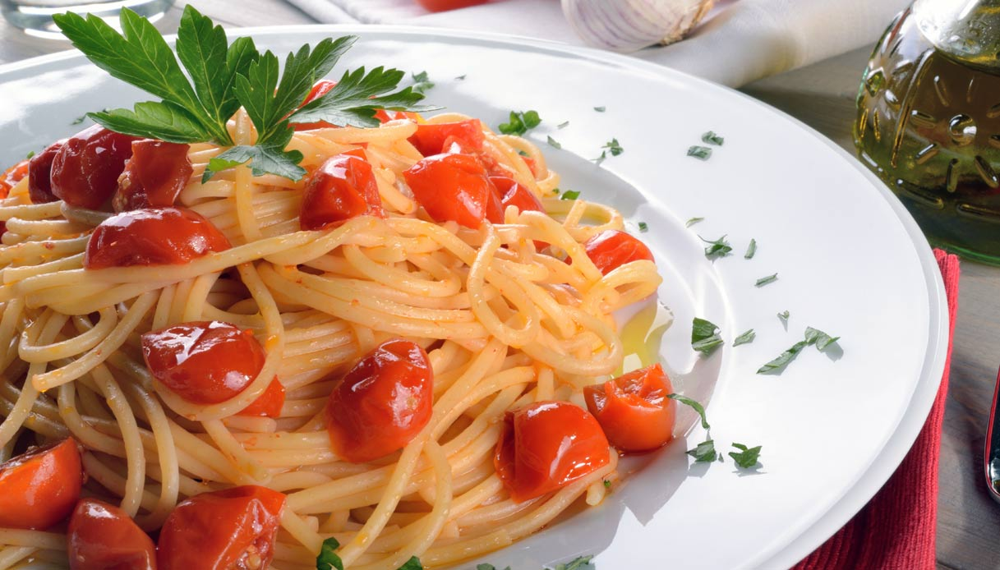

In [35]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_pomodorini_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  66
similarity value:  1.0
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  2
idx:  62
similarity value:  0.758425
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  3
idx:  57
similarity value:  0.750845
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  4
idx:  54
similarity value:  0.708187
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  5
idx:  56
similarity value:  0.70488966
name_image_found:  pasta_pesto_1.jpg
-----------------------


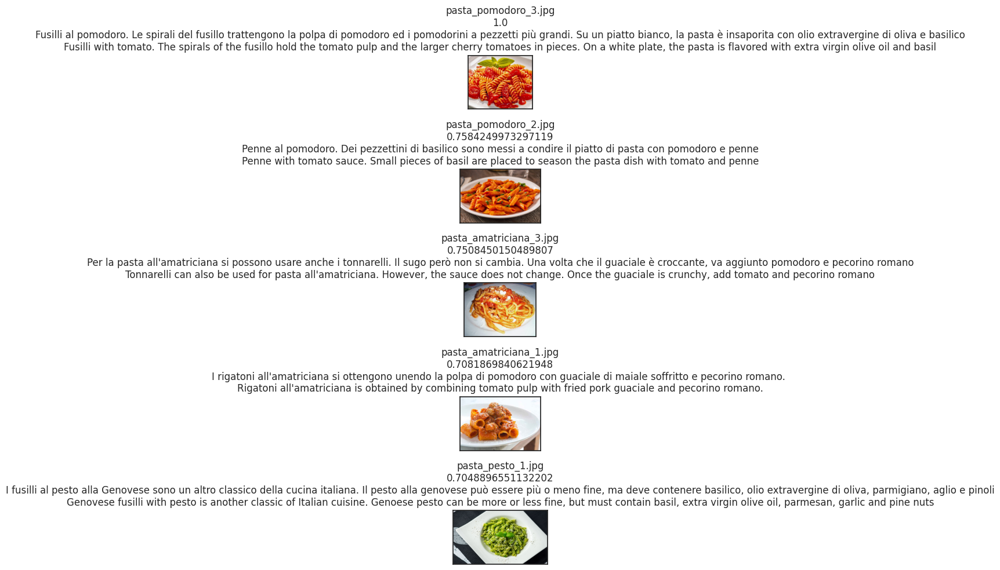

In [36]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 7

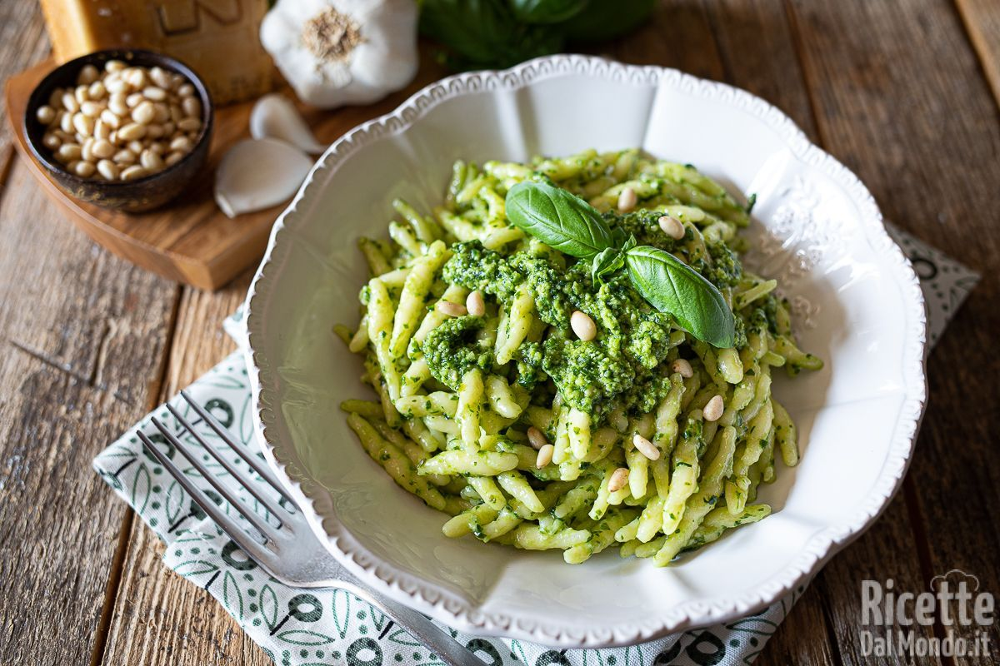

In [37]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/trofie_pesto_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  56
similarity value:  1.0
name_image_found:  pasta_pesto_1.jpg
-----------------------
Extracted:  2
idx:  58
similarity value:  0.726341
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  3
idx:  66
similarity value:  0.70488966
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  62
similarity value:  0.6817094
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  5
idx:  60
similarity value:  0.6558242
name_image_found:  carbonara_2.jpg
-----------------------


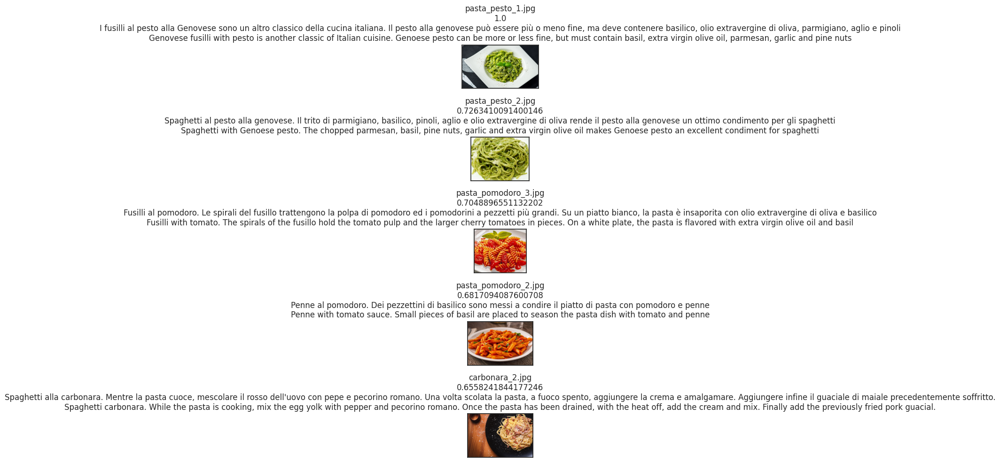

In [38]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 8

In [39]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/vitello_tonnato_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  60
similarity value:  1.0
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  57
similarity value:  0.7611495
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  3
idx:  62
similarity value:  0.6723311
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  4
idx:  58
similarity value:  0.6716552
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  5
idx:  56
similarity value:  0.6558242
name_image_found:  pasta_pesto_1.jpg
-----------------------


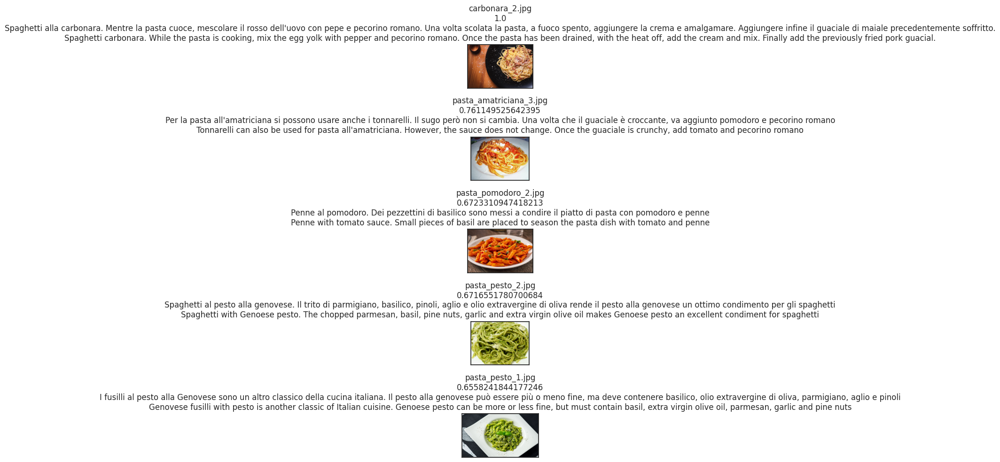

In [40]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 9

In [42]:
text_image_target = "Pizza quattro stagioni con olive, funghi e prosciutto cotto"
number_retrieval = 5

Extracted:  1
idx:  49
similarity value:  0.014534075
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  2
idx:  24
similarity value:  0.013088485
name_image_found:  pizza_napoli_2.jpg
-----------------------
Extracted:  3
idx:  27
similarity value:  0.010896364
name_image_found:  pizza_quattro_formaggi_1.jpg
-----------------------
Extracted:  4
idx:  28
similarity value:  0.007390354
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  5
idx:  7
similarity value:  0.005439124
name_image_found:  bigne_3.jpg
-----------------------


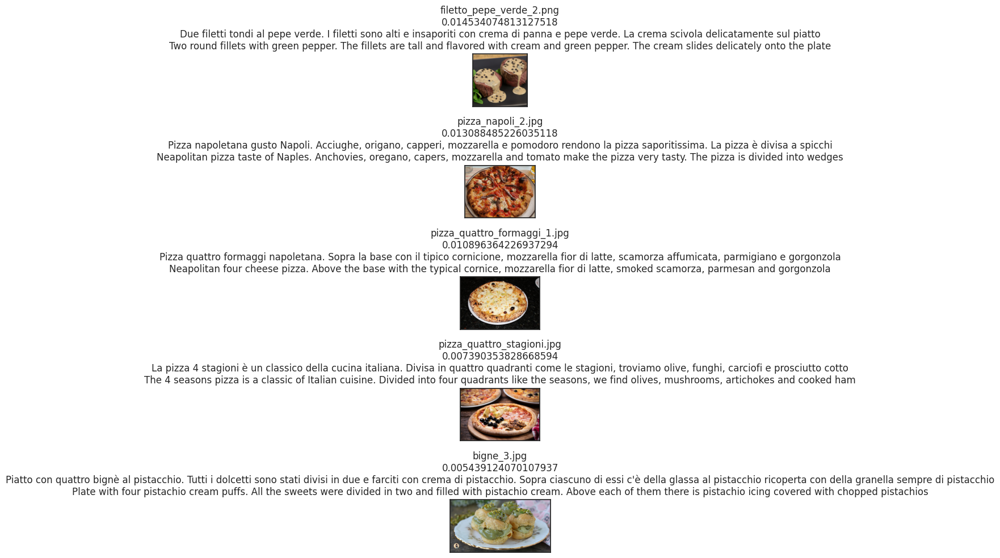

In [43]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  26
similarity value:  0.762577
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  2
idx:  60
similarity value:  0.6179188
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  3
idx:  49
similarity value:  0.5320413
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  4
idx:  1
similarity value:  0.49822688
name_image_found:  baba_3.jpg
-----------------------
Extracted:  5
idx:  14
similarity value:  0.47105187
name_image_found:  baba_1.jpeg
-----------------------


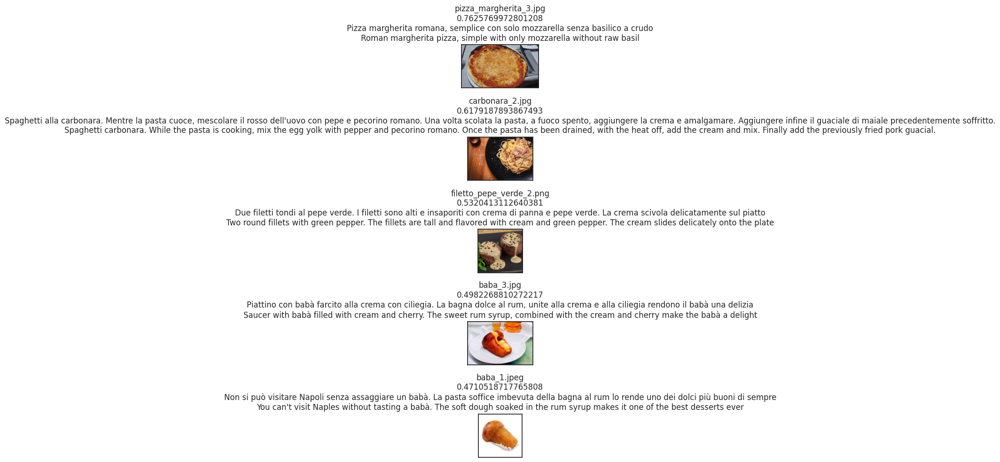

In [44]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  32
similarity value:  0.8885702
name_image_found:  pizza_quattro_stagioni_2.jpg
-----------------------
Extracted:  2
idx:  28
similarity value:  0.82812285
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  3
idx:  20
similarity value:  0.73481035
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  4
idx:  22
similarity value:  0.7312678
name_image_found:  pizza_capricciosa_1.jpg
-----------------------
Extracted:  5
idx:  34
similarity value:  0.7041482
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------


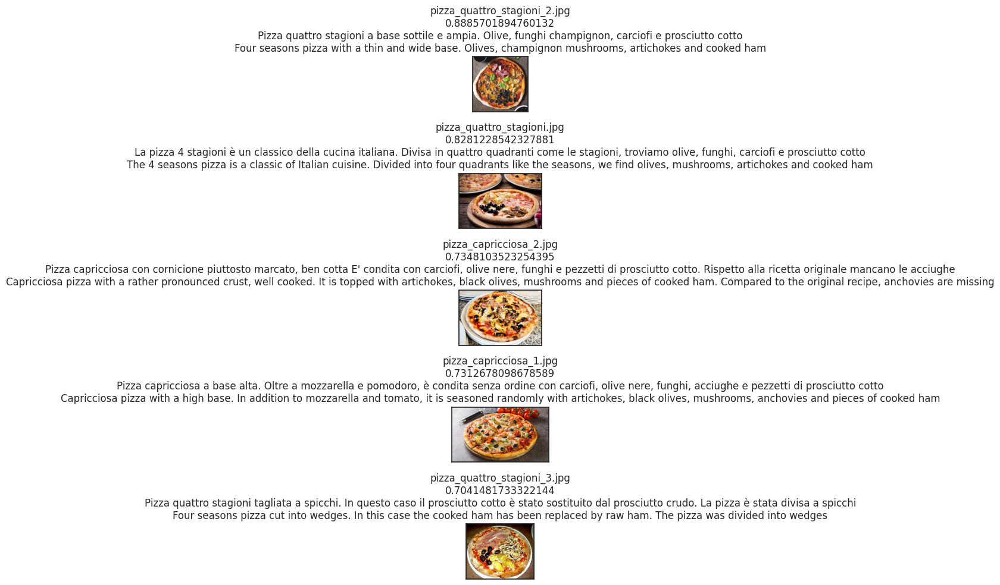

In [45]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")

plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 10

In [46]:
text_image_target = "PAppardelle al sugo di cinghiale senza pomodoro"
number_retrieval = 5

Extracted:  1
idx:  22
similarity value:  0.058133256
name_image_found:  pizza_capricciosa_1.jpg
-----------------------
Extracted:  2
idx:  44
similarity value:  0.053695317
name_image_found:  cosce_pollo_2.jpg
-----------------------
Extracted:  3
idx:  57
similarity value:  0.049747646
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  4
idx:  48
similarity value:  0.046221003
name_image_found:  bistecca_fiorentina_3.jpg
-----------------------
Extracted:  5
idx:  51
similarity value:  0.044403017
name_image_found:  porchetta_1.jpg
-----------------------


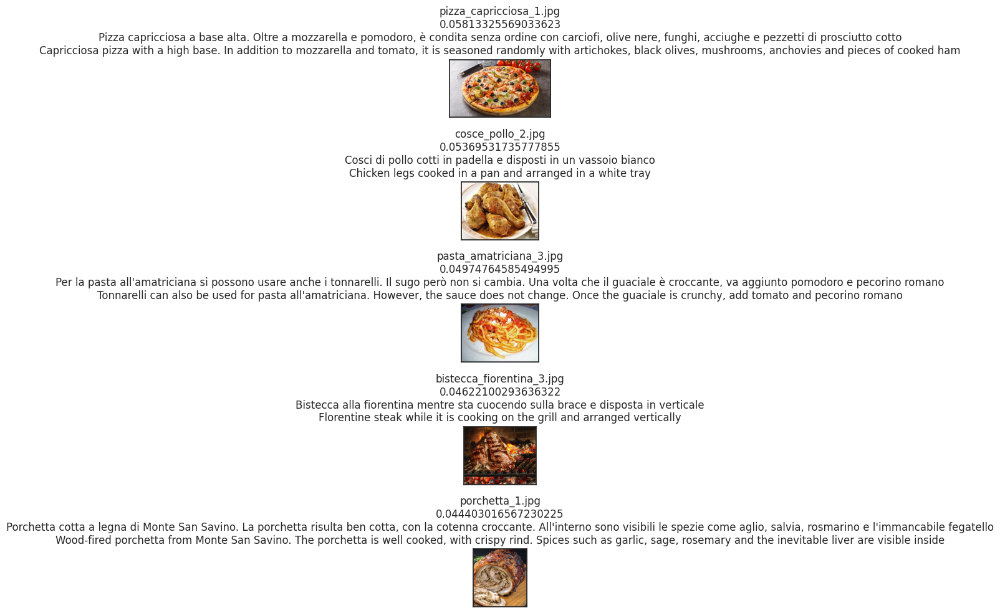

In [47]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  26
similarity value:  0.7637005
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  2
idx:  60
similarity value:  0.6630209
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  3
idx:  49
similarity value:  0.54324937
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  4
idx:  1
similarity value:  0.5292818
name_image_found:  baba_3.jpg
-----------------------
Extracted:  5
idx:  59
similarity value:  0.5252008
name_image_found:  carbonara_1.jpg
-----------------------


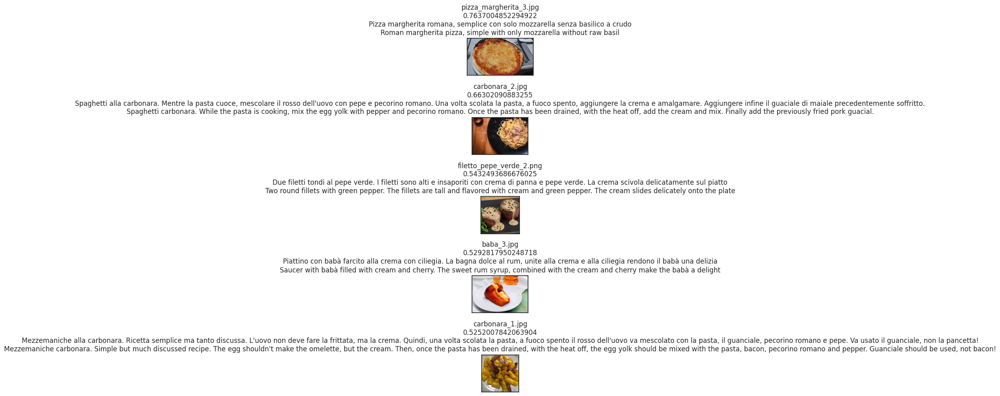

In [48]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  63
similarity value:  0.9061018
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------
Extracted:  2
idx:  65
similarity value:  0.8874023
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  3
idx:  54
similarity value:  0.6350833
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  62
similarity value:  0.590366
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  5
idx:  67
similarity value:  0.5861268
name_image_found:  carbonara_3.jpeg
-----------------------


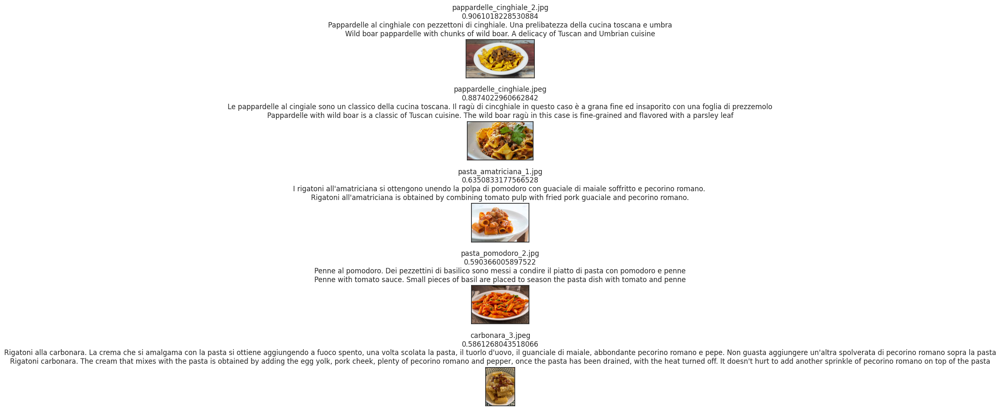

In [49]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 11

In [50]:
text_image_target = "Crostata con fragole, crema e gocce di cioccolato e zucchero a velo"
number_retrieval = 5

Extracted:  1
idx:  3
similarity value:  0.07170484
name_image_found:  crostata_2.jpg
-----------------------
Extracted:  2
idx:  24
similarity value:  0.06995686
name_image_found:  pizza_napoli_2.jpg
-----------------------
Extracted:  3
idx:  20
similarity value:  0.0696387
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  4
idx:  19
similarity value:  0.06751403
name_image_found:  pizza_marinara_3.jpg
-----------------------
Extracted:  5
idx:  21
similarity value:  0.06475239
name_image_found:  pizza_margherita_2.jpg
-----------------------


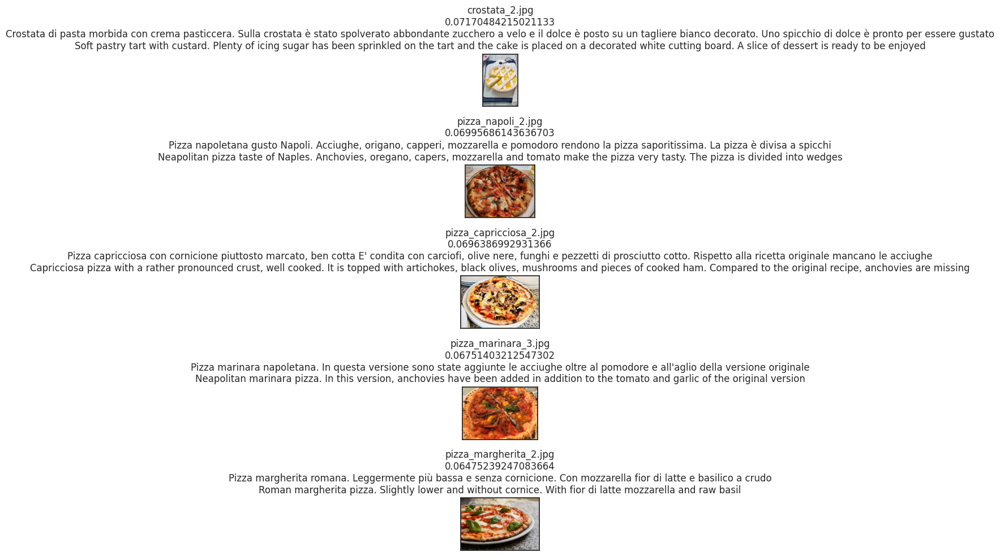

In [51]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  26
similarity value:  0.73705
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  2
idx:  60
similarity value:  0.58560145
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  3
idx:  1
similarity value:  0.5055066
name_image_found:  baba_3.jpg
-----------------------
Extracted:  4
idx:  49
similarity value:  0.5036097
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  5
idx:  14
similarity value:  0.43695566
name_image_found:  baba_1.jpeg
-----------------------


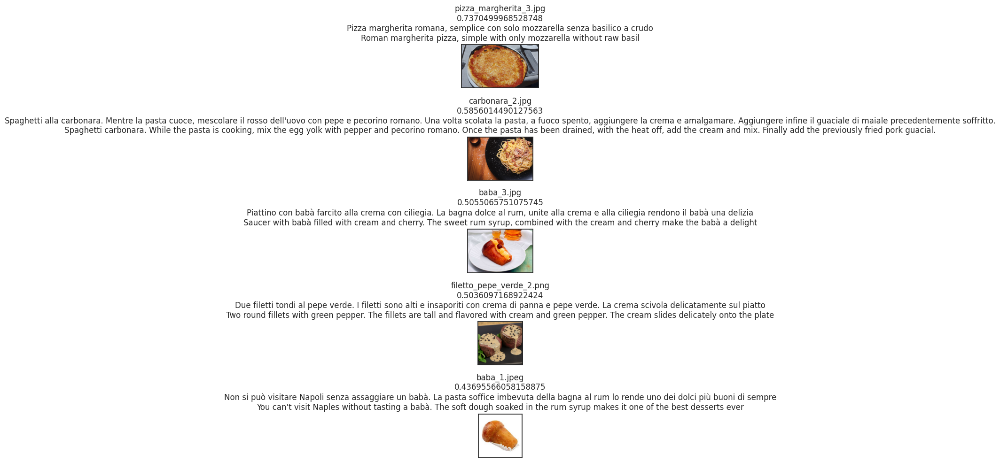

In [52]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  10
similarity value:  0.81014836
name_image_found:  millefoglie_3.jpg
-----------------------
Extracted:  2
idx:  8
similarity value:  0.74863636
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  3
idx:  13
similarity value:  0.7348354
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  4
idx:  0
similarity value:  0.7127102
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  5
idx:  12
similarity value:  0.6804741
name_image_found:  millefoglie_2.jpg
-----------------------


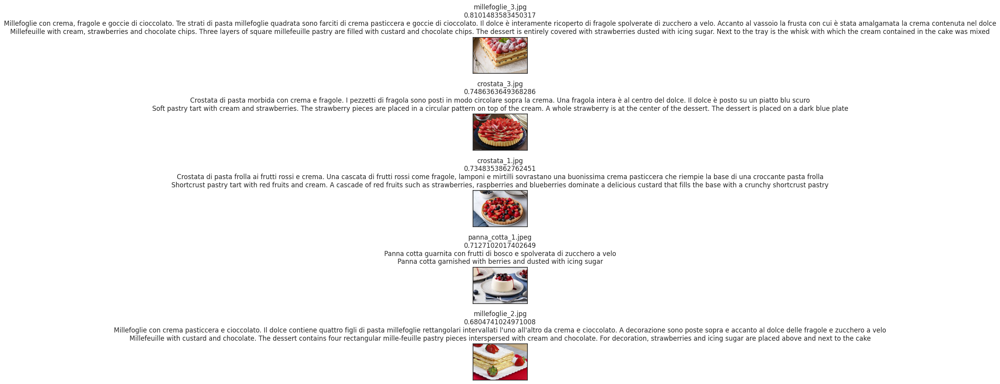

In [53]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 12

In [54]:
text_image_target = "Pasta all'amatriciana con pomodori, guanciale, spaghetti e spolverata di pecorino romano"
number_retrieval = 5

Extracted:  1
idx:  44
similarity value:  0.04782674
name_image_found:  cosce_pollo_2.jpg
-----------------------
Extracted:  2
idx:  34
similarity value:  0.041369505
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  3
idx:  53
similarity value:  0.036799215
name_image_found:  bistecca_fiorentina_1.jpg
-----------------------
Extracted:  4
idx:  35
similarity value:  0.03159057
name_image_found:  petto_pollo_pizzaiola_2.jpg
-----------------------
Extracted:  5
idx:  52
similarity value:  0.031266853
name_image_found:  petto_pollo_pizzaiola.jpg
-----------------------


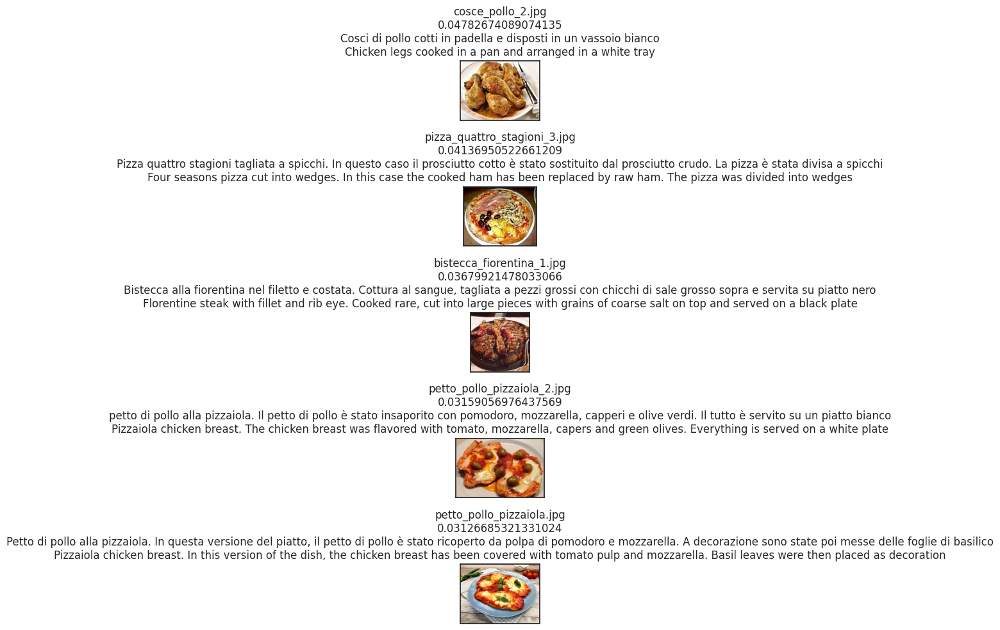

In [55]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  60
similarity value:  0.7963586
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  59
similarity value:  0.7918407
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  3
idx:  26
similarity value:  0.77339244
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  4
idx:  27
similarity value:  0.71072364
name_image_found:  pizza_quattro_formaggi_1.jpg
-----------------------
Extracted:  5
idx:  22
similarity value:  0.68571115
name_image_found:  pizza_capricciosa_1.jpg
-----------------------


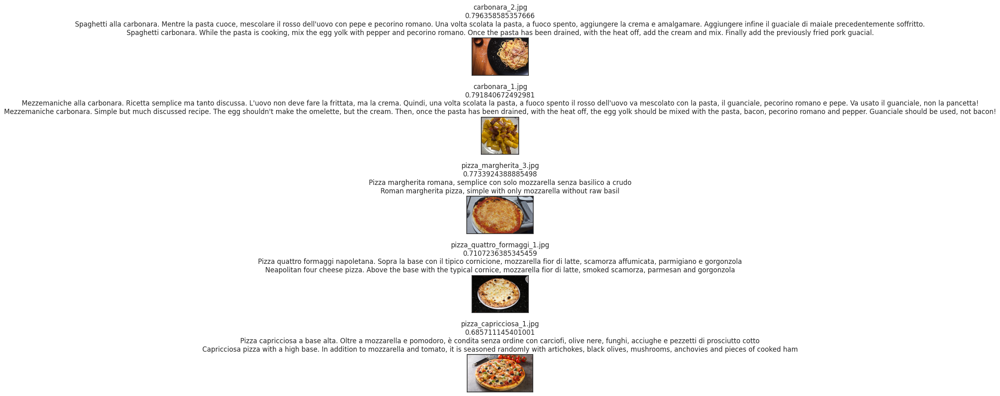

In [56]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  54
similarity value:  0.79758346
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  2
idx:  64
similarity value:  0.7960382
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  3
idx:  57
similarity value:  0.76602125
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  4
idx:  62
similarity value:  0.76121175
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  5
idx:  29
similarity value:  0.7340994
name_image_found:  pizza_marinara_1.jpg
-----------------------


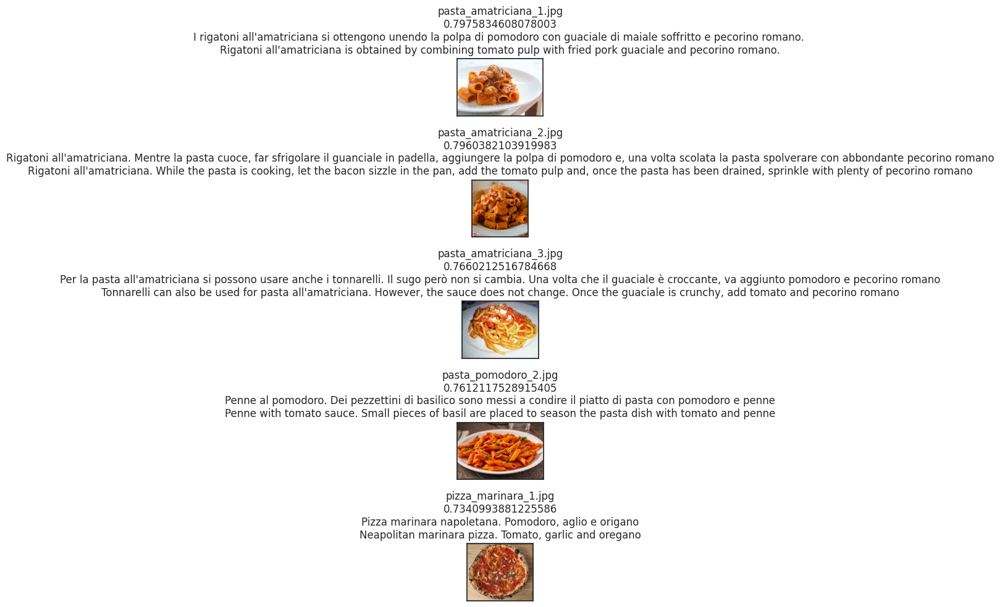

In [57]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()